In [ ]:
path = '../data'


C:\Users\amogh\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import os
os.listdir(path)

['BankChurners.csv']

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, RocCurveDisplay, precision_recall_curve
import tensorflow as tf
import tensorflow.keras as keras
from imblearn.over_sampling import SMOTE
from keras.optimizers.schedules import PolynomialDecay
from sklearn.tree import DecisionTreeClassifier
import shap
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV

# Filtering Data

In [11]:
df = pd.read_csv(path + "/BankChurners.csv")

In [12]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [13]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [14]:
df.drop(columns=['CLIENTNUM','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],inplace=True)

In [15]:
df.shape

(10127, 20)

In [16]:
for col in df:
  print(col,df[col].unique())

Attrition_Flag ['Existing Customer' 'Attrited Customer']
Customer_Age [45 49 51 40 44 32 37 48 42 65 56 35 57 41 61 47 62 54 59 63 53 58 55 66
 50 38 46 52 39 43 64 68 67 60 73 70 36 34 33 26 31 29 30 28 27]
Gender ['M' 'F']
Dependent_count [3 5 4 2 0 1]
Education_Level ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status ['Married' 'Single' 'Unknown' 'Divorced']
Income_Category ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Card_Category ['Blue' 'Gold' 'Silver' 'Platinum']
Months_on_book [39 44 36 34 21 46 27 31 54 30 48 37 56 42 49 33 28 38 41 43 45 52 40 50
 35 47 32 20 29 25 53 24 55 23 22 26 13 51 19 15 17 18 16 14]
Total_Relationship_Count [5 6 4 3 2 1]
Months_Inactive_12_mon [1 4 2 3 6 0 5]
Contacts_Count_12_mon [3 2 0 1 4 5 6]
Credit_Limit [12691.  8256.  3418. ...  5409.  5281. 10388.]
Total_Revolving_Bal [ 777  864    0 ...  534  476 2241]
Avg_Open_To_Buy [11914.  7392.  3418. ... 11831.  5

In [17]:
mask = (df['Marital_Status'] == 'Unknown') | (df['Education_Level'] == 'Unknown') | (df['Income_Category'] == 'Unknown')
df1 = df[~mask]

# Using data for EDA

In [11]:
Categoricals = ['Attrition_Flag','Gender','Education_Level',
                'Marital_Status','Income_Category',
                'Card_Category']
Numeric = ['Customer_Age','Dependent_count','Months_on_book',
           'Total_Relationship_Count','Months_Inactive_12_mon',
           'Contacts_Count_12_mon','Credit_Limit',
           'Total_Revolving_Bal']
Features = ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
        'Total_Trans_Amt', 'Total_Trans_Ct',
        'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
len(Categoricals) + len(Numeric) + len(Features)

20

## Customer Demographics

1. Dataset is imbalanced cuz too low attrited customers
2. Rest all categoricals have no anomalies
3. Distribution of Months_on_book is imbalanced cuz most people came in a 36 months gap
4. People's number of relationship with bank is left skewed that's a good thing
5. Distribution of inactive months is right skewed indicating possible future problems
6. But contacts made with bank in past is normal enough
7. Credit limit is right skewed that's understandable cuz most people in low level cards
8. Revolving Balance is well distibuted no issues here, there is a natural initial high spike cuz low income group is really big and they avoid credit.
9. Avg_open to buy is understandably similar to credit limit
10. Total_Amt_Chng_Q4_Q1 is right skewed , it's bad cuz people spending less
11. Total_tran_amt is like card category, cuz low level card low credit limit lesser spending on it
12. Total_Ct_chng_Q4_Q1 is <1 not good
13. Avg utlization is low pretty bad higly right skewed.

In [12]:
for col in df1:
  if col in Categoricals:
    print(col,df1[col].value_counts())

Attrition_Flag Attrition_Flag
Existing Customer    5968
Attrited Customer    1113
Name: count, dtype: int64
Gender Gender
M    3706
F    3375
Name: count, dtype: int64
Education_Level Education_Level
Graduate         2591
High School      1653
Uneducated       1204
College           844
Post-Graduate     431
Doctorate         358
Name: count, dtype: int64
Marital_Status Marital_Status
Married     3564
Single      2948
Divorced     569
Name: count, dtype: int64
Income_Category Income_Category
Less than $40K    2792
$40K - $60K       1412
$80K - $120K      1202
$60K - $80K       1103
$120K +            572
Name: count, dtype: int64
Card_Category Card_Category
Blue        6598
Silver       391
Gold          81
Platinum      11
Name: count, dtype: int64


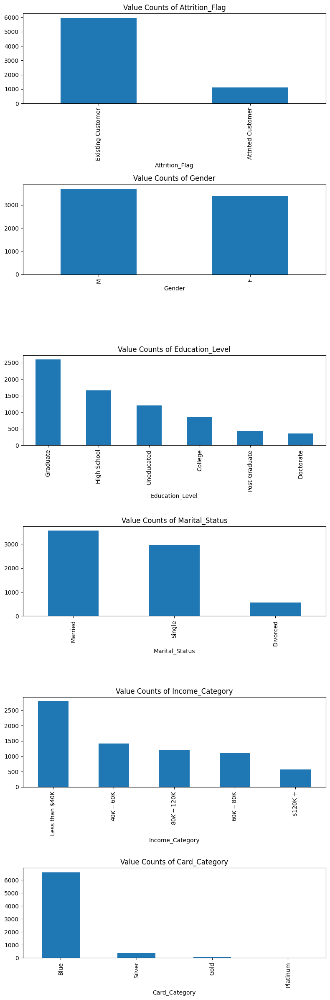

In [13]:
fig, axes = plt.subplots(nrows=len(Categoricals), ncols=1, figsize=(8, 4*len(Categoricals)))

for i, col in enumerate(Categoricals):
    df1[col].value_counts().plot.bar(ax=axes[i])
    axes[i].set_title(f'Value Counts of {col}')

plt.tight_layout()
plt.show()
# Dataset is imbalanced cuz too low attrited customers
# Rest all categoricals have no anomalies

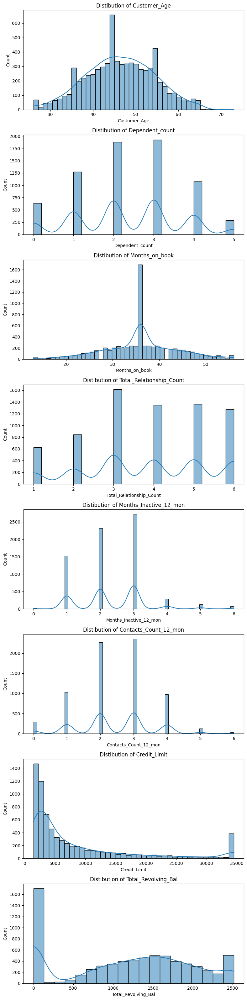

In [14]:
fig, axes = plt.subplots(nrows=len(Numeric), ncols=1, figsize=(8, 4*len(Numeric)))

for i, col in enumerate(Numeric):
    sns.histplot(df1[col], ax=axes[i],kde=True)
    axes[i].set_title(f'Distibution of {col}')

plt.tight_layout()
plt.show()
# Distribution of Months_on_book is imbalanced cuz most people came in a 36 months gap
# People's number of relationship with bank is left skewed that's a good thing
# Distribution of inactive months is right skewed indicating possible future problems
# But contacts made with bank in past is normal enough
# Credit limit is right skewed that's understandable cuz most people in low level cards
# Revolving Balance is well distibuted no issues here, there is a natural initial high spike cuz low income group is really big and they avoid credit.

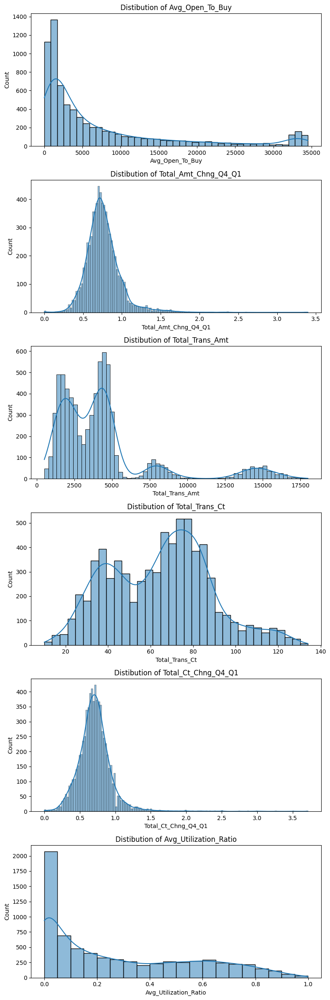

In [15]:
fig, axes = plt.subplots(nrows=len(Features), ncols=1, figsize=(8, 4*len(Features)))

for i, col in enumerate(Features):
    sns.histplot(df1[col], ax=axes[i],kde=True)
    axes[i].set_title(f'Distibution of {col}')

plt.tight_layout()
plt.show()
# Avg_open to buy is understandably similar to credit limit
# Total_Amt_Chng_Q4_Q1 is right skewed , it's bad cuz people spending less
# Total_tran_amt is like card category, cuz low level card low credit limit lesser spending on it
# Total_Ct_chng_Q4_Q1 is <1 not good
# Avg utlization is low pretty bad higly right skewed.

## Demographics <--> Attrition Relation

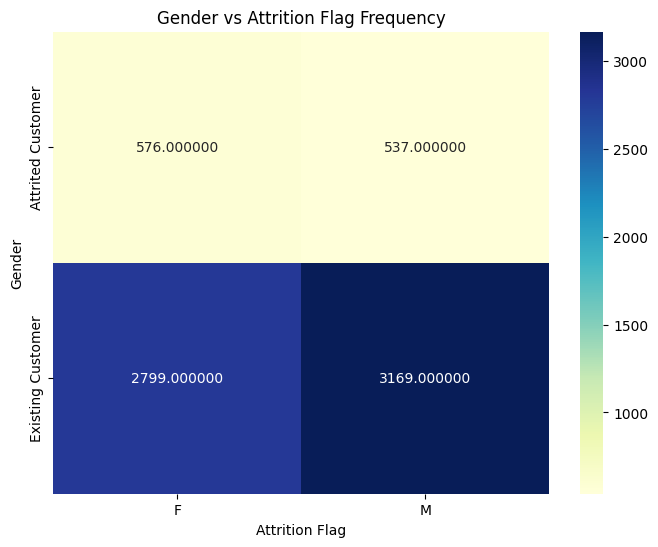

In [16]:
d = df1[['Gender','Attrition_Flag']]
ct = pd.crosstab(columns=d['Gender'], index=d['Attrition_Flag'])
# ct['Percentage_Attrited'] = ct['Attrited Customer'] / (ct['Attrited Customer'] + ct['Existing Customer']) * 100

plt.figure(figsize=(8, 6))
sns.heatmap(ct, annot=True, fmt='f', cmap='YlGnBu')  # 'YlGnBu' is a good colormap for frequency
plt.title('Gender vs Attrition Flag Frequency')
plt.ylabel('Gender')
plt.xlabel('Attrition Flag')
plt.show()

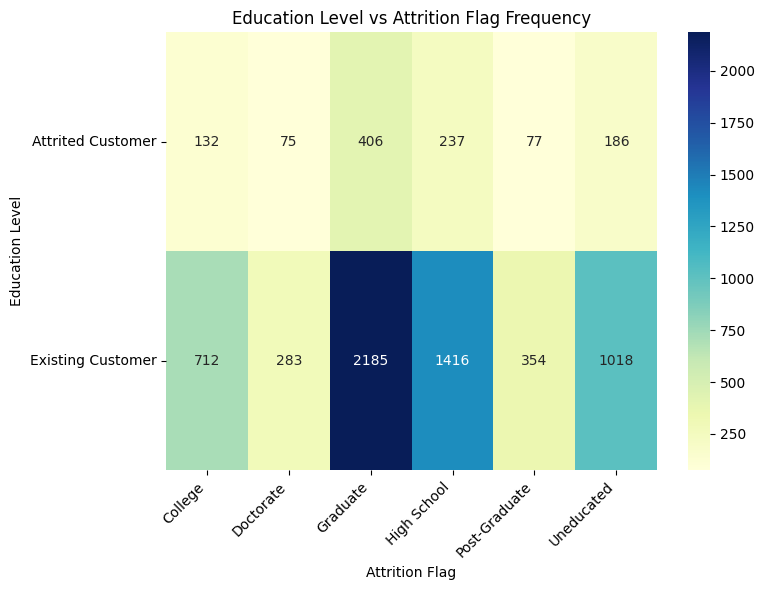

In [17]:
d1 = df1[['Education_Level','Attrition_Flag']]
ct1 = pd.crosstab(columns=d1['Education_Level'], index=d1['Attrition_Flag'])
plt.figure(figsize=(8, 6))
sns.heatmap(ct1, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Education Level vs Attrition Flag Frequency')
plt.ylabel('Education Level')
plt.xlabel('Attrition Flag')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [18]:
ct1_swapped = ct1.T
ct1_swapped['Percentage_Attrited'] = ct1_swapped['Attrited Customer'] / (ct1_swapped['Attrited Customer'] + ct1_swapped['Existing Customer']) * 100
ct1_swapped

Attrition_Flag,Attrited Customer,Existing Customer,Percentage_Attrited
Education_Level,,,
College,132,712,15.639810
Doctorate,75,283,20.949721
Graduate,406,2185,15.669626
High School,237,1416,14.337568
Post-Graduate,77,354,17.865429
Uneducated,186,1018,15.448505


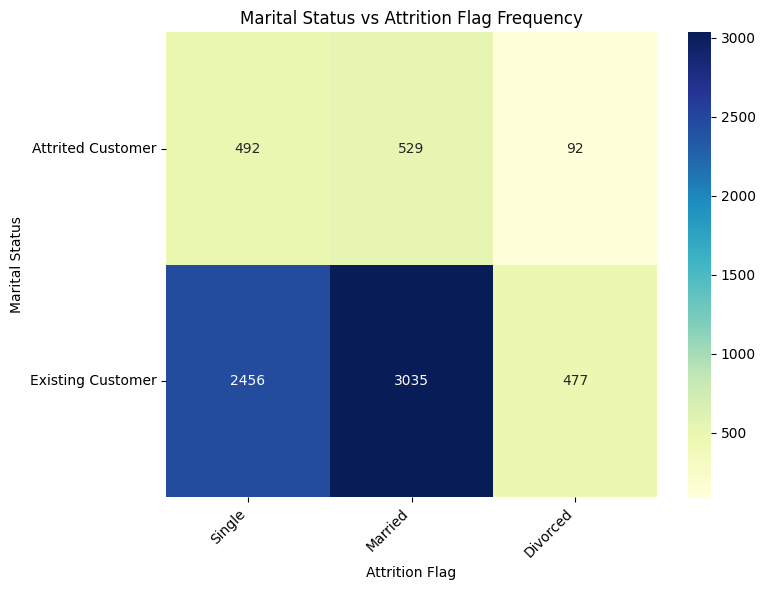

Attrition_Flag,Attrited Customer,Existing Customer,Percentage_Attrited
Marital_Status,,,
Single,492,2456,16.689281
Married,529,3035,14.842873
Divorced,92,477,16.168717


In [19]:
d3 = df1[['Marital_Status','Attrition_Flag']]
ct3 = pd.crosstab(columns=d3['Marital_Status'], index=d3['Attrition_Flag'])
ct3 = ct3[['Single','Married','Divorced']]
plt.figure(figsize=(8, 6))
sns.heatmap(ct3, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Marital Status vs Attrition Flag Frequency')
plt.ylabel('Marital Status')
plt.xlabel('Attrition Flag')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()
ct3_swapped = ct3.T
ct3_swapped['Percentage_Attrited'] = ct3_swapped['Attrited Customer'] / (ct3_swapped['Attrited Customer'] + ct3_swapped['Existing Customer']) * 100
ct3_swapped

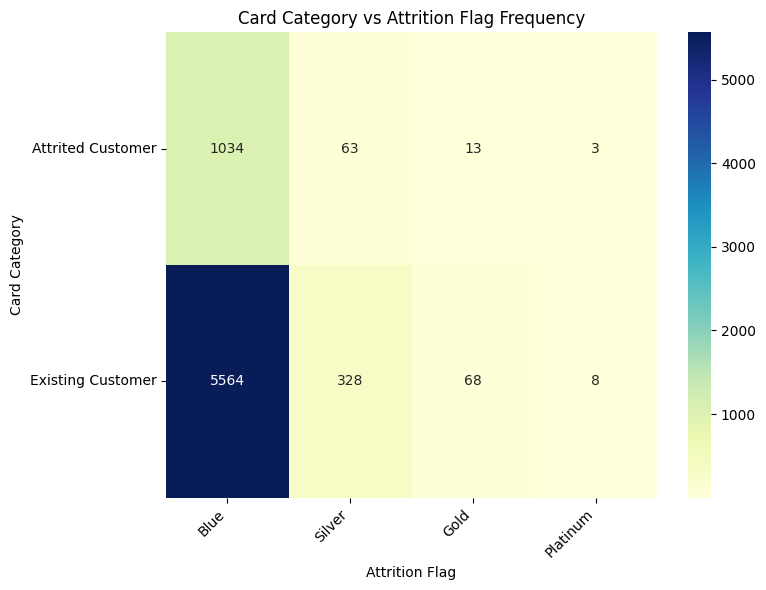

Attrition_Flag,Attrited Customer,Existing Customer,Percentage_Attrited
Card_Category,,,
Blue,1034,5564,15.671416
Silver,63,328,16.112532
Gold,13,68,16.049383
Platinum,3,8,27.272727


In [20]:
d4 = df1[['Card_Category','Attrition_Flag']]
ct4 = pd.crosstab(columns=d4['Card_Category'], index=d4['Attrition_Flag'])
ct4 = ct4[['Blue','Silver','Gold','Platinum']]
plt.figure(figsize=(8, 6))
sns.heatmap(ct4, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Card Category vs Attrition Flag Frequency')
plt.ylabel('Card Category')
plt.xlabel('Attrition Flag')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()
ct4_swapped = ct4.T
ct4_swapped['Percentage_Attrited'] = ct4_swapped['Attrited Customer'] / (ct4_swapped['Attrited Customer'] + ct4_swapped['Existing Customer']) * 100
ct4_swapped

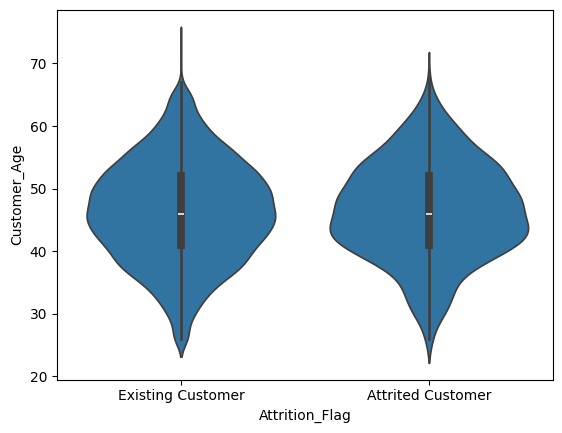

In [21]:
sns.violinplot(data=df1, x='Attrition_Flag', y='Customer_Age')
plt.xlabel('Attrition_Flag')
plt.ylabel('Customer_Age')
plt.show()

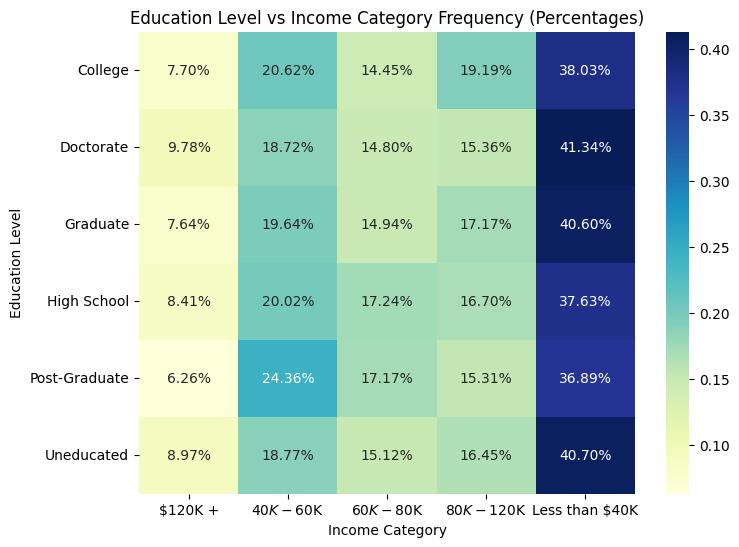

In [22]:
d = df1[['Education_Level','Income_Category']]
ct = pd.crosstab(index=d['Education_Level'], columns=d['Income_Category'])

ct_percent = ct.div(ct.sum(axis=1), axis=0)
plt.figure(figsize=(8, 6))
sns.heatmap(ct_percent, annot=True, fmt='.2%', cmap='YlGnBu')
plt.title('Education Level vs Income Category Frequency (Percentages)')
plt.ylabel('Education Level')
plt.xlabel('Income Category')
plt.show()

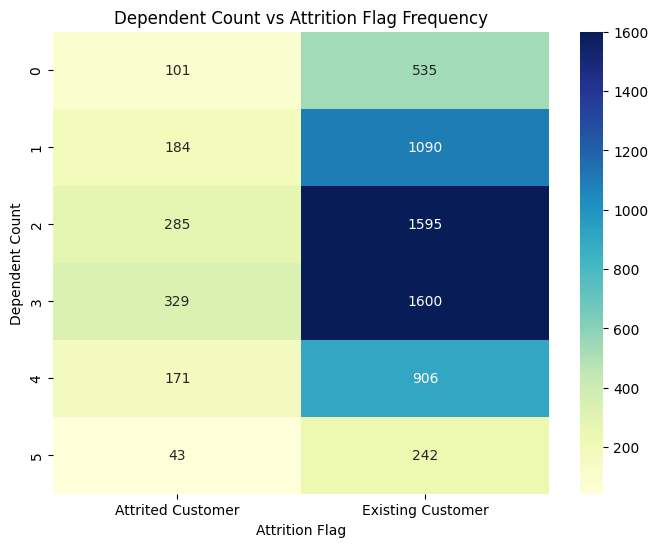

In [23]:
ct = pd.crosstab(index=df1['Dependent_count'], columns=df1['Attrition_Flag'])

plt.figure(figsize=(8, 6))
sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Dependent Count vs Attrition Flag Frequency')
plt.ylabel('Dependent Count')
plt.xlabel('Attrition Flag')
plt.show()

Dependent_count ↔ Total_Trans_Amt ,
Attrition_Flag

More dependents may mean higher spending and usage, possibly reducing attrition.

Well it doesn't

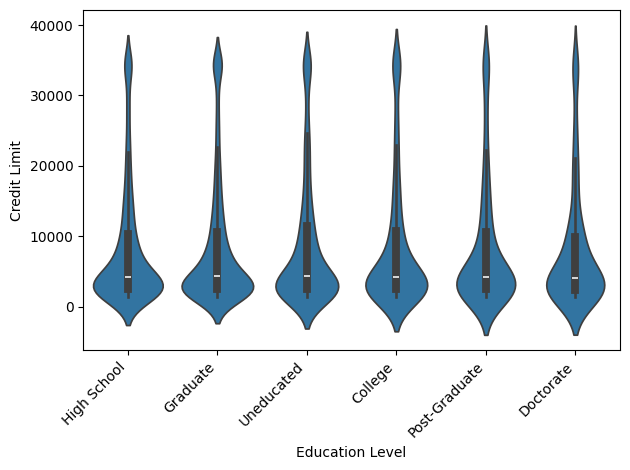

In [24]:
sns.violinplot(data=df1, x='Education_Level', y='Credit_Limit')
plt.xlabel('Education Level')
plt.ylabel('Credit Limit')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

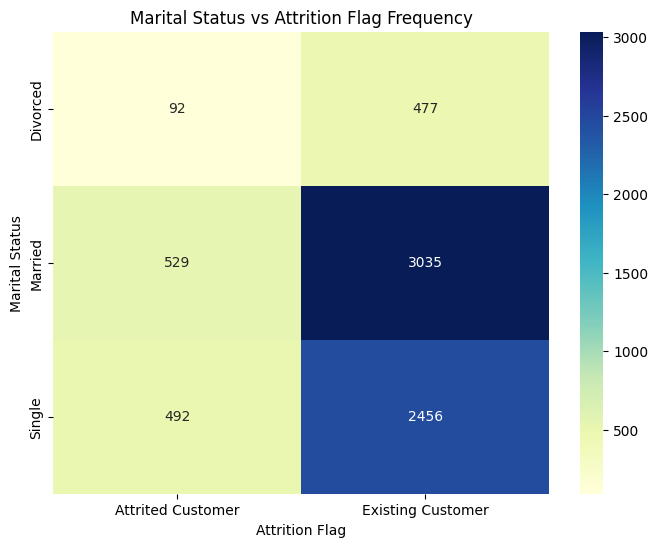

In [25]:
ct = pd.crosstab(index=df1['Marital_Status'], columns=df1['Attrition_Flag'])

plt.figure(figsize=(8, 6))
sns.heatmap(ct, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Marital Status vs Attrition Flag Frequency')
plt.ylabel('Marital Status')
plt.xlabel('Attrition Flag')
plt.show()


## Card Details relation to Loyalty

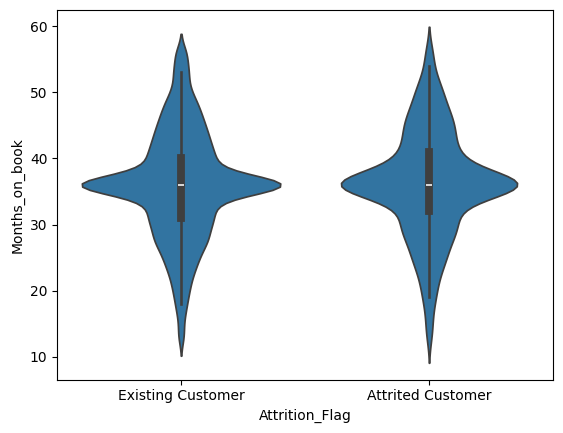

In [26]:
sns.violinplot(data=df1, x='Attrition_Flag', y='Months_on_book')
plt.xlabel('Attrition_Flag')
plt.ylabel('Months_on_book')
plt.show()

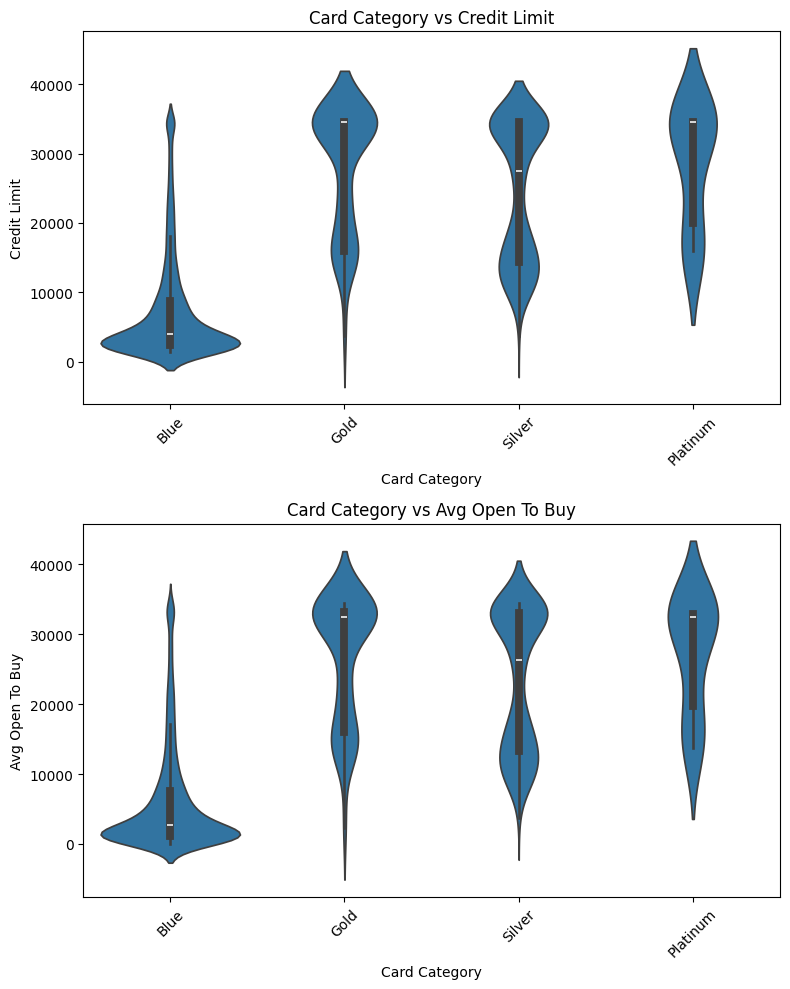

In [27]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 10))

sns.violinplot(data=df1, x='Card_Category', y='Credit_Limit', ax=axes[0])
axes[0].set_title('Card Category vs Credit Limit')
axes[0].set_xlabel('Card Category')
axes[0].set_ylabel('Credit Limit')
axes[0].tick_params(axis='x', rotation=45)


sns.violinplot(data=df1, x='Card_Category', y='Avg_Open_To_Buy', ax=axes[1])
axes[1].set_title('Card Category vs Avg Open To Buy')
axes[1].set_xlabel('Card Category')
axes[1].set_ylabel('Avg Open To Buy')
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

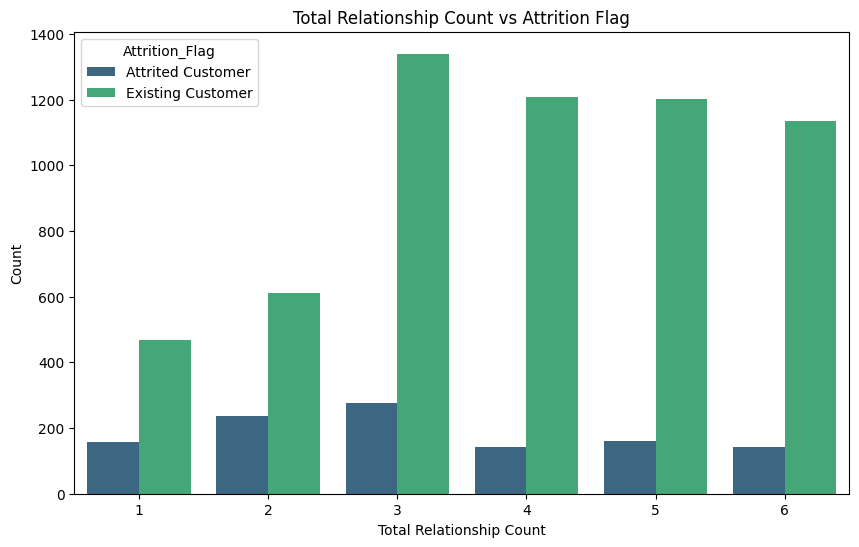

In [28]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df1, x='Total_Relationship_Count', hue='Attrition_Flag', palette='viridis')
plt.title('Total Relationship Count vs Attrition Flag')
plt.xlabel('Total Relationship Count')
plt.ylabel('Count')
plt.show()

## Account Activity ↔ Engagement

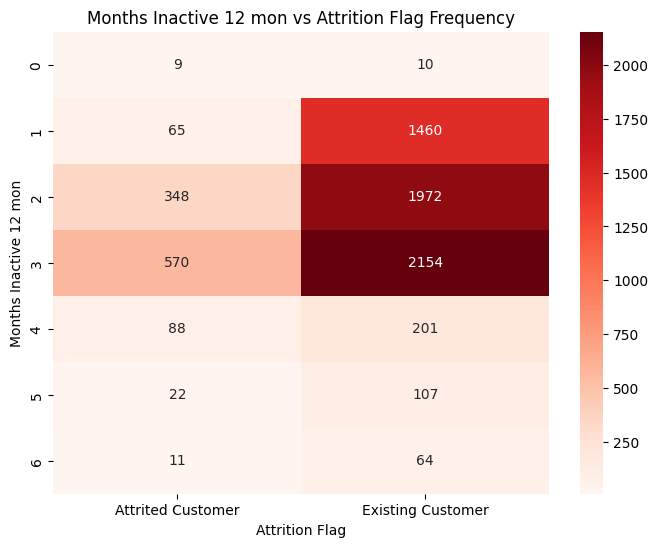

In [29]:
# prompt: Months_Inactive_12_mon ↔ Attrition_Flag make cross tab then color
# change colors higher number is reddish

ct = pd.crosstab(index=df1['Months_Inactive_12_mon'], columns=df1['Attrition_Flag'])

plt.figure(figsize=(8, 6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Reds')
plt.title('Months Inactive 12 mon vs Attrition Flag Frequency')
plt.ylabel('Months Inactive 12 mon')
plt.xlabel('Attrition Flag')
plt.show()

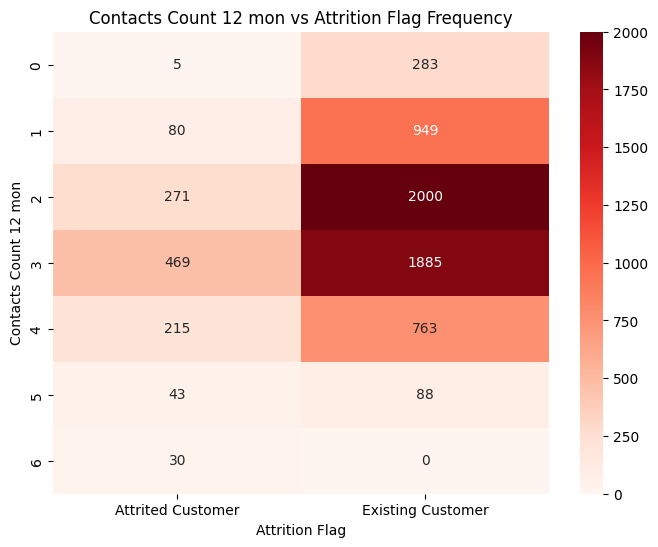

In [30]:
ct = pd.crosstab(index=df1['Contacts_Count_12_mon'], columns=df1['Attrition_Flag'])

plt.figure(figsize=(8, 6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Reds')
plt.title('Contacts Count 12 mon vs Attrition Flag Frequency')
plt.ylabel('Contacts Count 12 mon')
plt.xlabel('Attrition Flag')
plt.show()

# Model 1( Linear Regression)

## Preparing data for ML/DL

In [31]:
df2 = df1
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [32]:
df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])

In [33]:
df2.replace({False:0,True:1},inplace=True)

/tmp/ipython-input-33-3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [34]:
df2.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,Existing Customer,45,M,3,39,5,1,3,12691.0,777,...,0,0,0,1,0,0,1,0,0,0
1,Existing Customer,49,F,5,44,6,1,2,8256.0,864,...,1,0,0,0,0,1,1,0,0,0
2,Existing Customer,51,M,3,36,4,1,0,3418.0,0,...,0,0,0,0,1,0,1,0,0,0
4,Existing Customer,40,M,3,21,5,1,0,4716.0,0,...,0,0,0,1,0,0,1,0,0,0
5,Existing Customer,44,M,2,36,3,1,2,4010.0,1247,...,0,0,1,0,0,0,1,0,0,0


In [35]:
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [36]:
df2.shape

(7081, 34)

In [37]:
for col in df2:
    print(col,df2[col].unique())

Attrition_Flag ['Existing Customer' 'Attrited Customer']
Customer_Age [45 49 51 40 44 37 48 56 57 61 47 62 41 53 58 55 42 50 59 46 52 54 66 39
 43 64 67 60 68 63 73 70 35 34 38 36 65 33 26 31 29 30 32 28 27]
Gender ['M' 'F']
Dependent_count [3 5 2 1 4 0]
Months_on_book [39 44 36 21 48 56 42 49 33 28 38 41 43 37 30 45 52 40 54 50 34 35 32 20
 29 47 31 46 27 53 24 55 23 22 26 25 13 51 15 17 19 18 16 14]
Total_Relationship_Count [5 6 4 3 2 1]
Months_Inactive_12_mon [1 2 3 6 0 5 4]
Contacts_Count_12_mon [3 2 0 1 4 5 6]
Credit_Limit [12691.  8256.  3418. ...  4003.  5409. 10388.]
Total_Revolving_Bal [ 777  864    0 ... 1500  476 2241]
Avg_Open_To_Buy [11914.  7392.  3418. ... 11831.  5409.  8427.]
Total_Amt_Chng_Q4_Q1 [1.335 1.541 2.594 ... 0.225 0.202 0.222]
Total_Trans_Amt [ 1144  1291  1887 ... 15476 10291 10294]
Total_Trans_Ct [ 42  33  20  28  24  32  17  29  27  30  16  18  22  38  26  43  37  40
  19  15  23  35  41  36  57  31  14  21  34  25  13  47  10  39  53  50
  52  48  12  49

In [38]:
df2[Features]

,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,11914.0,1.335,1144,42,1.625,0.061
1,7392.0,1.541,1291,33,3.714,0.105
2,3418.0,2.594,1887,20,2.333,0.000
4,4716.0,2.175,816,28,2.500,0.000
5,2763.0,1.376,1088,24,0.846,0.311
...,...,...,...,...,...,...
10120,11831.0,0.660,15577,114,0.754,0.151
10121,3082.0,0.570,14596,120,0.791,0.164
10122,2152.0,0.703,15476,117,0.857,0.462
10124,5409.0,0.819,10291,60,0.818,0.000


In [39]:
df2[Numeric]

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal
0,45,3,39,5,1,3,12691.0,777
1,49,5,44,6,1,2,8256.0,864
2,51,3,36,4,1,0,3418.0,0
4,40,3,21,5,1,0,4716.0,0
5,44,2,36,3,1,2,4010.0,1247
...,...,...,...,...,...,...,...,...
10120,54,1,34,5,2,0,13940.0,2109
10121,56,1,50,4,1,4,3688.0,606
10122,50,2,40,3,2,3,4003.0,1851
10124,44,1,36,5,3,4,5409.0,0


In [40]:
df2.dtypes

,0
Attrition_Flag,object
Customer_Age,int64
Gender,object
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64


In [41]:
df2.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,Existing Customer,45,M,3,39,5,1,3,12691.0,777,...,0,0,0,1,0,0,1,0,0,0
1,Existing Customer,49,F,5,44,6,1,2,8256.0,864,...,1,0,0,0,0,1,1,0,0,0
2,Existing Customer,51,M,3,36,4,1,0,3418.0,0,...,0,0,0,0,1,0,1,0,0,0
4,Existing Customer,40,M,3,21,5,1,0,4716.0,0,...,0,0,0,1,0,0,1,0,0,0
5,Existing Customer,44,M,2,36,3,1,2,4010.0,1247,...,0,0,1,0,0,0,1,0,0,0


In [42]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

/tmp/ipython-input-42-479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [43]:
for col in df2:
  if df2[col].dtype == 'object':
    print(col,df2[col].unique())

Gender ['M' 'F']


In [44]:
df2.replace({'M':1,'F':0},inplace=True)

/tmp/ipython-input-44-1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [45]:
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [46]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal']
drop = ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
        # 'Education_Level_College', 'Education_Level_Doctorate',
      #  'Education_Level_Graduate', 'Education_Level_High School',
      #  'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
      #  'Marital_Status_Divorced', 'Marital_Status_Married',
      #  'Marital_Status_Single', 'Income_Category_$120K +',
      #  'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
      #  'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Avg_Utilization_Ratio']
df3 = df2.drop(columns=drop)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df3[cols_to_scale] = scaler.fit_transform(df3[cols_to_scale])

In [47]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

## Making and trainning NN

In [48]:
X

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Education_Level_College,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0.404255,1,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,0,...,0,0,0,1,0,0,1,0,0,0
1,0.489362,0,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,0,...,1,0,0,0,0,1,1,0,0,0
2,0.531915,1,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,0,...,0,0,0,0,1,0,1,0,0,0
4,0.297872,1,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,0,...,0,0,0,1,0,0,1,0,0,0
5,0.382979,1,0.4,0.534884,0.4,0.166667,0.333333,0.077747,0.495431,0,...,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10120,0.595745,1,0.2,0.488372,0.8,0.333333,0.000000,0.377949,0.837902,0,...,1,0,0,1,0,0,1,0,0,0
10121,0.638298,0,0.2,0.860465,0.6,0.166667,0.666667,0.068013,0.240763,0,...,1,0,0,0,0,1,1,0,0,0
10122,0.510638,1,0.4,0.627907,0.4,0.333333,0.500000,0.077536,0.735399,0,...,1,0,1,0,0,0,1,0,0,0
10124,0.382979,0,0.2,0.534884,0.8,0.500000,0.666667,0.120042,0.000000,0,...,0,0,0,0,0,1,1,0,0,0


In [49]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [50]:
y_test.value_counts()

,count
Attrition_Flag,
1,1205
0,212


In [51]:
import tensorflow as tf
import tensorflow.keras as keras

In [52]:
X_test.shape

(1417, 27)

In [53]:
model = keras.Sequential([keras.layers.Dense(27,input_shape=(27,),activation='relu'),
                         keras.layers.Dense(1,activation='sigmoid')])

model.compile(optimizer='SGD',loss='binary_crossentropy',metrics=['accuracy'])
model.fit(X_train,y_train,epochs=100)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8371 - loss: 0.4773
Epoch 2/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8339 - loss: 0.4361
Epoch 3/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8381 - loss: 0.4235
Epoch 4/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8416 - loss: 0.4134
Epoch 5/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8415 - loss: 0.4116
Epoch 6/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8409 - loss: 0.4100
Epoch 7/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8419 - loss: 0.4048
Epoch 8/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8437 - loss: 0.4003
Epoch 9/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8455 - loss: 0.3934
Epoch 10/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8469 - loss: 0.3944
Epoch 11/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8444 - loss: 0.3939
Epoch 12/100
177/177 ━━━━━━━━━━━━━━━━━━━

In [54]:
model.evaluate(X_test,y_test)

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8707 - loss: 0.3390


[0.33527863025665283, 0.8694424629211426]

In [55]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
[[  40  172]
 [  13 1192]]
              precision    recall  f1-score   support

           0       0.75      0.19      0.30       212
           1       0.87      0.99      0.93      1205

    accuracy                           0.87      1417
   macro avg       0.81      0.59      0.61      1417
weighted avg       0.86      0.87      0.83      1417



# Model 2 ( remove items method for reducing data imbalance)( Linear Regression)

## Dataset preparation

In [56]:
df2 = df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [57]:
df2.replace({False:0,True:1},inplace=True)

/tmp/ipython-input-57-3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [58]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

/tmp/ipython-input-58-479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [59]:
df2.replace({'M':1,'F':0},inplace=True)

/tmp/ipython-input-59-1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [60]:
df2.dtypes

,0
Attrition_Flag,int64
Customer_Age,int64
Gender,int64
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64


In [61]:
df2.Attrition_Flag.value_counts()

,count
Attrition_Flag,
1,5968
0,1113


In [62]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal']
drop = ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
      #   'Education_Level_College', 'Education_Level_Doctorate',
      #  'Education_Level_Graduate', 'Education_Level_High School',
      #  'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
      #  'Marital_Status_Divorced', 'Marital_Status_Married',
      #  'Marital_Status_Single', 'Income_Category_$120K +',
      #  'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
      #  'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Avg_Utilization_Ratio']
df3 = df2.drop(columns=drop)

scaler = MinMaxScaler()
df3[cols_to_scale] = scaler.fit_transform(df3[cols_to_scale])

In [63]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [65]:
train_merged = pd.concat([X_train, y_train], axis=1)
train_merged_1 = train_merged[train_merged['Attrition_Flag'] == 1]
train_merged_0 = train_merged[train_merged['Attrition_Flag'] == 0]
train_merged_1 = train_merged_1.sample(n=len(train_merged_0), random_state=42)
train_merged = pd.concat([train_merged_1, train_merged_0])
X_train = train_merged.drop(columns=['Attrition_Flag'])
y_train = train_merged['Attrition_Flag']

In [66]:
y_train.value_counts()

,count
Attrition_Flag,
1,901
0,901


## Model Trainning

In [67]:
X_test.head()

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Education_Level_College,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
9866,0.170213,0,0.4,0.232558,0.6,0.333333,0.333333,0.186098,0.572904,0,...,1,0,1,0,0,0,1,0,0,0
9239,0.382979,1,0.8,0.604651,0.2,0.333333,0.500000,0.249222,0.686134,0,...,1,0,0,1,0,0,1,0,0,0
963,0.468085,0,0.4,0.720930,0.8,0.166667,0.500000,0.094677,0.969011,1,...,0,0,0,0,0,1,1,0,0,0
1999,0.000000,0,0.0,0.046512,0.4,0.333333,0.500000,0.000112,0.567342,0,...,1,0,0,0,0,1,1,0,0,0
2531,0.702128,1,0.2,0.534884,1.0,0.333333,0.333333,0.026051,0.780691,0,...,0,0,1,0,0,0,1,0,0,0


In [68]:
model = keras.Sequential([keras.layers.Dense(27,input_shape=(27,),activation='relu'),
                         keras.layers.Dense(1,activation='sigmoid')])

model.compile(optimizer='SGD',loss='binary_crossentropy',metrics=['accuracy'])
model.fit(X_train,y_train,epochs=100)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5112 - loss: 0.6961
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5476 - loss: 0.6852
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5344 - loss: 0.6878
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5796 - loss: 0.6791
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5751 - loss: 0.6800
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5901 - loss: 0.6753
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6223 - loss: 0.6713
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6082 - loss: 0.6743
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6205 - loss: 0.6726
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6233 - loss: 0.6653
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6310 - loss: 0.6677
Epoch 12/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy:

In [69]:
model.evaluate(X_test,y_test)

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7303 - loss: 0.5486


[0.5630447864532471, 0.702187716960907]

In [70]:

y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
[[158  54]
 [368 837]]
              precision    recall  f1-score   support

           0       0.30      0.75      0.43       212
           1       0.94      0.69      0.80      1205

    accuracy                           0.70      1417
   macro avg       0.62      0.72      0.61      1417
weighted avg       0.84      0.70      0.74      1417



# Model 3 ( copying items method for reducing data imbalance)( Linear Regression)

## Dataset preparation

In [71]:
df2 = df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [72]:
df2.replace({False:0,True:1},inplace=True)

/tmp/ipython-input-72-3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [73]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

/tmp/ipython-input-73-479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [74]:
df2.replace({'M':1,'F':0},inplace=True)

/tmp/ipython-input-74-1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [75]:
df2.dtypes

,0
Attrition_Flag,int64
Customer_Age,int64
Gender,int64
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64


In [76]:
df2.Attrition_Flag.value_counts()

,count
Attrition_Flag,
1,5968
0,1113


In [77]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal']
drop = ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
        'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Avg_Utilization_Ratio']
df3 = df2.drop(columns=drop)

scaler = MinMaxScaler()
df3[cols_to_scale] = scaler.fit_transform(df3[cols_to_scale])

In [78]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [80]:
train_merged = pd.concat([X_train, y_train], axis=1)
train_merged_1 = train_merged[train_merged['Attrition_Flag'] == 1]
train_merged_0 = train_merged[train_merged['Attrition_Flag'] == 0]
train_merged_0 = train_merged_0.sample(n=len(train_merged_1), random_state=42,replace=True)
train_merged = pd.concat([train_merged_1, train_merged_0],axis=0)
X_train = train_merged.drop(columns=['Attrition_Flag'])
y_train = train_merged['Attrition_Flag']

In [81]:
y_train.value_counts()

,count
Attrition_Flag,
1,4763
0,4763


## Model Trainning

In [82]:
X_test.head()

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
9866,0.170213,0,0.4,0.232558,0.6,0.333333,0.333333,0.186098,0.572904,1,0,0,0
9239,0.382979,1,0.8,0.604651,0.2,0.333333,0.500000,0.249222,0.686134,1,0,0,0
963,0.468085,0,0.4,0.720930,0.8,0.166667,0.500000,0.094677,0.969011,1,0,0,0
1999,0.000000,0,0.0,0.046512,0.4,0.333333,0.500000,0.000112,0.567342,1,0,0,0
2531,0.702128,1,0.2,0.534884,1.0,0.333333,0.333333,0.026051,0.780691,1,0,0,0


In [83]:
model = keras.Sequential([keras.layers.Dense(27,input_shape=(13,),activation='relu'),
                         keras.layers.Dense(1,activation='sigmoid')])

model.compile(optimizer='SGD',loss='binary_crossentropy',metrics=['accuracy'])
model.fit(X_train,y_train,epochs=100)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4507 - loss: 0.7163
Epoch 2/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5669 - loss: 0.6823
Epoch 3/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6994 - loss: 0.6553
Epoch 4/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7243 - loss: 0.6331
Epoch 5/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7261 - loss: 0.6191
Epoch 6/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7252 - loss: 0.6068
Epoch 7/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7221 - loss: 0.5950
Epoch 8/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7084 - loss: 0.6000
Epoch 9/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7217 - loss: 0.5859
Epoch 10/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7212 - loss: 0.5848
Epoch 11/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7117 - loss: 0.5817
Epoch 12/100
298/298 ━━━━━━━━━━━━━━━━━━━━

In [84]:
model.evaluate(X_test,y_test)

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7834 - loss: 0.4971


[0.506710946559906, 0.7791107892990112]

In [85]:
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
[[166  46]
 [267 938]]
              precision    recall  f1-score   support

           0       0.38      0.78      0.51       212
           1       0.95      0.78      0.86      1205

    accuracy                           0.78      1417
   macro avg       0.67      0.78      0.69      1417
weighted avg       0.87      0.78      0.81      1417



# Model 4 (SMOTE)( Linear Regression)

## Dataset preparation

In [86]:
df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [87]:
df2.replace({False:0,True:1},inplace=True)

/tmp/ipython-input-87-3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [88]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

/tmp/ipython-input-88-479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [89]:
df2.replace({'M':1,'F':0},inplace=True)

/tmp/ipython-input-89-1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [90]:
df2.dtypes

,0
Attrition_Flag,int64
Customer_Age,int64
Gender,int64
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64


In [91]:
df2.Attrition_Flag.value_counts()

,count
Attrition_Flag,
1,5968
0,1113


In [92]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal']
drop = ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
        'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Avg_Utilization_Ratio']
df3 = df2.drop(columns=drop)
scaler = MinMaxScaler()
df3 = scaler.fit_transform(df3)

In [93]:
df3 = pd.DataFrame(df3, columns=[col for col in df2.columns if col not in drop])
df3.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,1.0,0.404255,1.0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,1.0,0.0,0.0,0.0
1,1.0,0.489362,0.0,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,1.0,0.0,0.0,0.0
2,1.0,0.531915,1.0,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,1.0,0.0,0.0,0.0
3,1.0,0.297872,1.0,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,1.0,0.0,0.0,0.0
4,1.0,0.382979,1.0,0.4,0.534884,0.4,0.166667,0.333333,0.077747,0.495431,1.0,0.0,0.0,0.0


In [94]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

In [95]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [96]:
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

print("Shape of X_train after SMOTE:", X_train.shape)
print("Shape of y_train after SMOTE:", y_train.shape)
print("Value counts of y_train after SMOTE:\n", y_train.value_counts())

Shape of X_train after SMOTE: (9526, 13)
Shape of y_train after SMOTE: (9526,)
Value counts of y_train after SMOTE:
 Attrition_Flag
1.0    4763
0.0    4763
Name: count, dtype: int64


In [97]:
y_train.value_counts()

,count
Attrition_Flag,
1.0,4763
0.0,4763


## Model Trainning

In [98]:
X_test.head()

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
6885,0.170213,0.0,0.4,0.232558,0.6,0.333333,0.333333,0.186098,0.572904,1.0,0.0,0.0,0.0
6438,0.382979,1.0,0.8,0.604651,0.2,0.333333,0.500000,0.249222,0.686134,1.0,0.0,0.0,0.0
711,0.468085,0.0,0.4,0.720930,0.8,0.166667,0.500000,0.094677,0.969011,1.0,0.0,0.0,0.0
1499,0.000000,0.0,0.0,0.046512,0.4,0.333333,0.500000,0.000112,0.567342,1.0,0.0,0.0,0.0
1905,0.702128,1.0,0.2,0.534884,1.0,0.333333,0.333333,0.026051,0.780691,1.0,0.0,0.0,0.0


In [99]:
y_train.value_counts()

,count
Attrition_Flag,
1.0,4763
0.0,4763


In [100]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [101]:
model1 = keras.Sequential([keras.layers.Dense(27,input_shape=(13,),activation='relu'),
                         keras.layers.Dense(1,activation='sigmoid')])
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model1.compile(optimizer='Adam',loss='binary_crossentropy',metrics=['accuracy'])
model1.fit(X_train,y_train,epochs=100,callbacks=[tensorboard_callback])

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


298/298 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5952 - loss: 0.6754
Epoch 2/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7164 - loss: 0.5957
Epoch 3/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7261 - loss: 0.5610
Epoch 4/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7239 - loss: 0.5573
Epoch 5/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7318 - loss: 0.5404
Epoch 6/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7285 - loss: 0.5439
Epoch 7/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7462 - loss: 0.5247
Epoch 8/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7444 - loss: 0.5221
Epoch 9/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7493 - loss: 0.5123
Epoch 10/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7609 - loss: 0.5089
Epoch 11/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7685 - loss: 0.4949
Epoch 12/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

In [102]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [103]:
model1.evaluate(X_test,y_test)

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7727 - loss: 0.4758


[0.47263970971107483, 0.7755821943283081]

In [104]:
y_pred = model1.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
[[159  53]
 [265 940]]
              precision    recall  f1-score   support

         0.0       0.38      0.75      0.50       212
         1.0       0.95      0.78      0.86      1205

    accuracy                           0.78      1417
   macro avg       0.66      0.77      0.68      1417
weighted avg       0.86      0.78      0.80      1417



# Model 5 (SMOTE)( Linear Regression)(Using Schedulers)



## Dataset preparation

In [105]:
df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [106]:
df2.replace({False:0,True:1},inplace=True)

/tmp/ipython-input-106-3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [107]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

/tmp/ipython-input-107-479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [108]:
df2.replace({'M':1,'F':0},inplace=True)

/tmp/ipython-input-108-1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [109]:
df2.dtypes

,0
Attrition_Flag,int64
Customer_Age,int64
Gender,int64
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64


In [110]:
df2.Attrition_Flag.value_counts()

,count
Attrition_Flag,
1,5968
0,1113


In [111]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal']
# drop = ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
      #  'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
      #   'Education_Level_College', 'Education_Level_Doctorate',
      #  'Education_Level_Graduate', 'Education_Level_High School',
      #  'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
      #  'Marital_Status_Divorced', 'Marital_Status_Married',
      #  'Marital_Status_Single', 'Income_Category_$120K +',
      #  'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
      #  'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
      #  'Avg_Utilization_Ratio']
df3 = df2#.drop(columns=drop)

scaler = MinMaxScaler()
df3 = scaler.fit_transform(df3)

In [112]:
df3 = pd.DataFrame(df3, columns=[col for col in df2.columns ])#if col not in drop
df3.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,1.0,0.404255,1.0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.489362,0.0,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2,1.0,0.531915,1.0,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,1.0,0.297872,1.0,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.382979,1.0,0.4,0.534884,0.4,0.166667,0.333333,0.077747,0.495431,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [113]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

In [114]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [115]:
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

print("Shape of X_train after SMOTE:", X_train.shape)
print("Shape of y_train after SMOTE:", y_train.shape)
print("Value counts of y_train after SMOTE:\n", y_train.value_counts())

Shape of X_train after SMOTE: (9526, 33)
Shape of y_train after SMOTE: (9526,)
Value counts of y_train after SMOTE:
 Attrition_Flag
1.0    4763
0.0    4763
Name: count, dtype: int64


In [116]:
y_train.value_counts()

,count
Attrition_Flag,
1.0,4763
0.0,4763


## Model Trainning

In [117]:
X_test.head()

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
6885,0.170213,0.0,0.4,0.232558,0.6,0.333333,0.333333,0.186098,0.572904,0.178165,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6438,0.382979,1.0,0.8,0.604651,0.2,0.333333,0.500000,0.249222,0.686134,0.230406,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
711,0.468085,0.0,0.4,0.720930,0.8,0.166667,0.500000,0.094677,0.969011,0.061658,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
1499,0.000000,0.0,0.0,0.046512,0.4,0.333333,0.500000,0.000112,0.567342,0.000319,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
1905,0.702128,1.0,0.2,0.534884,1.0,0.333333,0.333333,0.026051,0.780691,0.009620,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [118]:
y_train.value_counts()

,count
Attrition_Flag,
1.0,4763
0.0,4763


In [119]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [120]:
inputs = keras.Input(shape=(33,))
x1 = keras.layers.Dense(33, activation='relu')(inputs)
x2 = keras.layers.Dense(33, activation='relu')(x1)
added = keras.layers.Add()([x1, x2])
x3 = keras.layers.Dense(17, activation='relu')(added)
x4 = keras.layers.Dense(8, activation='relu')(x3)
outputs = keras.layers.Dense(1, activation='sigmoid')(x4)
model = keras.Model(inputs=inputs, outputs=outputs)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y\%m\%d-%H:%M:%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

num_epochs = 100

initial_learning_rate = 0.01
end_learning_rate = 0.0001 # You can set an end learning rate
power = 1.0 # Use 1.0 for linear decay, >1.0 for steeper decay, <1.0 for flatter decay

lr_schedule = PolynomialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=num_epochs*len(X_train),
    end_learning_rate=end_learning_rate,
    power=power
)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
model.compile(optimizer=optimizer,loss='binary_crossentropy',metrics=['accuracy'])

In [121]:
model.fit(X_train,y_train,epochs=100,callbacks=[tensorboard_callback])

Epoch 1/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7255 - loss: 0.5151
Epoch 2/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8643 - loss: 0.3138
Epoch 3/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8812 - loss: 0.2795
Epoch 4/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9015 - loss: 0.2414
Epoch 5/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9065 - loss: 0.2339
Epoch 6/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9061 - loss: 0.2246
Epoch 7/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9116 - loss: 0.2163
Epoch 8/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9218 - loss: 0.2007
Epoch 9/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9188 - loss: 0.1946
Epoch 10/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9146 - loss: 0.2019
Epoch 11/100
298/298 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9293 - loss: 0.1804
Epoch 12/100
298/298 ━━━━━━━━━━━━━━━━━━━━

In [122]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 5700), started 0:02:14 ago. (Use '!kill 5700' to kill it.)

<IPython.core.display.Javascript object>

In [123]:
model.evaluate(X_test,y_test)

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9133 - loss: 0.3692


[0.4405847191810608, 0.9082568883895874]

In [124]:
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.45).astype(int)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
[[ 159   53]
 [  71 1134]]
              precision    recall  f1-score   support

         0.0       0.69      0.75      0.72       212
         1.0       0.96      0.94      0.95      1205

    accuracy                           0.91      1417
   macro avg       0.82      0.85      0.83      1417
weighted avg       0.92      0.91      0.91      1417



# Model 6(SMOTE)(Decision Trees)(No schdulers)


## Dataset preparation

In [125]:
df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [126]:
df2.replace({False:0,True:1},inplace=True)

/tmp/ipython-input-126-3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [127]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

/tmp/ipython-input-127-479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [128]:
df2.replace({'M':1,'F':0},inplace=True)

/tmp/ipython-input-128-1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [129]:
df2.dtypes

,0
Attrition_Flag,int64
Customer_Age,int64
Gender,int64
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64


In [130]:
df2.Attrition_Flag.value_counts()

,count
Attrition_Flag,
1,5968
0,1113


In [131]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal']
# drop = ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
      #  'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
      #   'Education_Level_College', 'Education_Level_Doctorate',
      #  'Education_Level_Graduate', 'Education_Level_High School',
      #  'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
      #  'Marital_Status_Divorced', 'Marital_Status_Married',
      #  'Marital_Status_Single', 'Income_Category_$120K +',
      #  'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
      #  'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
      #  'Avg_Utilization_Ratio']
df3 = df2#.drop(columns=drop)
scaler = MinMaxScaler()
df3 = scaler.fit_transform(df3)

In [132]:
df3 = pd.DataFrame(df3, columns=[col for col in df2.columns ])#if col not in drop
df3.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,1.0,0.404255,1.0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.489362,0.0,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2,1.0,0.531915,1.0,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,1.0,0.297872,1.0,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.382979,1.0,0.4,0.534884,0.4,0.166667,0.333333,0.077747,0.495431,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [133]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

In [134]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [135]:
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

print("Shape of X_train after SMOTE:", X_train.shape)
print("Shape of y_train after SMOTE:", y_train.shape)
print("Value counts of y_train after SMOTE:\n", y_train.value_counts())

Shape of X_train after SMOTE: (9526, 33)
Shape of y_train after SMOTE: (9526,)
Value counts of y_train after SMOTE:
 Attrition_Flag
1.0    4763
0.0    4763
Name: count, dtype: int64


In [136]:
y_train.value_counts()

,count
Attrition_Flag,
1.0,4763
0.0,4763


## Model Trainning

In [137]:
# Initialize and train the Decision Tree Classifier
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_model.predict(X_test)

# Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Confusion Matrix:
[[ 178   34]
 [  70 1135]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.72      0.84      0.77       212
         1.0       0.97      0.94      0.96      1205

    accuracy                           0.93      1417
   macro avg       0.84      0.89      0.87      1417
weighted avg       0.93      0.93      0.93      1417



# Model 7 (Random Forest + SMOTE + Calibration)

## Dataset preparation

In [138]:
df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])
df2.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,Existing Customer,45,M,3,39,5,1,3,12691.0,777,...,False,False,False,True,False,False,True,False,False,False
1,Existing Customer,49,F,5,44,6,1,2,8256.0,864,...,True,False,False,False,False,True,True,False,False,False
2,Existing Customer,51,M,3,36,4,1,0,3418.0,0,...,False,False,False,False,True,False,True,False,False,False
4,Existing Customer,40,M,3,21,5,1,0,4716.0,0,...,False,False,False,True,False,False,True,False,False,False
5,Existing Customer,44,M,2,36,3,1,2,4010.0,1247,...,False,False,True,False,False,False,True,False,False,False


In [139]:
df2.replace({False:0,True:1},inplace=True)

/tmp/ipython-input-139-3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [140]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

/tmp/ipython-input-140-479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [141]:
df2.replace({'M':1,'F':0},inplace=True)

/tmp/ipython-input-141-1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [142]:
df2.dtypes

,0
Attrition_Flag,int64
Customer_Age,int64
Gender,int64
Dependent_count,int64
Months_on_book,int64
Total_Relationship_Count,int64
Months_Inactive_12_mon,int64
Contacts_Count_12_mon,int64
Credit_Limit,float64
Total_Revolving_Bal,int64


In [143]:
df2.Attrition_Flag.value_counts()

,count
Attrition_Flag,
1,5968
0,1113


## Optional Dataset manipulation

In [144]:
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [145]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
drop = [
    # 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
    #    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
        'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
      #  'Marital_Status_Divorced', 'Marital_Status_Married',
      #  'Marital_Status_Single',
    'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K','Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
      #  'Avg_Utilization_Ratio',
    'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'
       ]
df3 = df2.drop(columns=drop)

In [146]:
# df3 = pd.DataFrame(df3, columns=[col for col in df2.columns ])#if col not in drop


In [147]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [149]:
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print("Shape of X_train after SMOTE:", X_resampled.shape)
print("Shape of y_train after SMOTE:", y_resampled.shape)

Shape of X_train after SMOTE: (9526, 18)
Shape of y_train after SMOTE: (9526,)


In [150]:
scaler = MinMaxScaler()
X_resampled[cols_to_scale] = scaler.fit_transform(X_resampled[cols_to_scale])
X_test[cols_to_scale] = scaler.transform(X_test[cols_to_scale])

In [151]:
y_resampled.value_counts()

,count
Attrition_Flag,
1,4763
0,4763


## Model Trainning

In [152]:
rf = RandomForestClassifier(n_estimators=200, class_weight='balanced_subsample')
# rf_calibrated = CalibratedClassifierCV(rf, method='sigmoid', cv=3)
rf.fit(X_resampled, y_resampled)

RandomForestClassifier(class_weight='balanced_subsample', n_estimators=200)

## Model Report

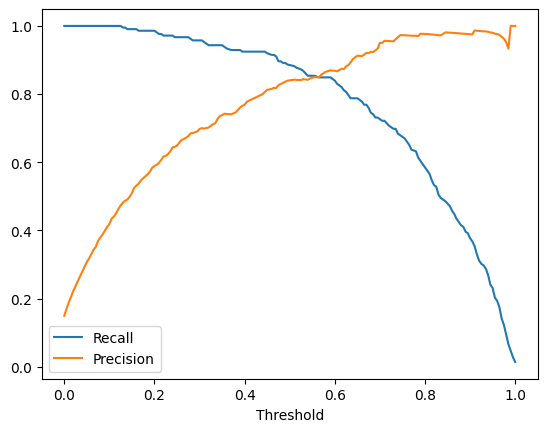

In [153]:

y_scores = rf.predict_proba(X_test)[:, 0]  # Prob of being class 0
precision, recall, thresholds = precision_recall_curve(y_test, y_scores, pos_label=0)

# Plot
plt.plot(thresholds, recall[:-1], label='Recall')
plt.plot(thresholds, precision[:-1], label='Precision')
plt.xlabel('Threshold')
plt.legend()
plt.show()

[[ 196   16]
 [  54 1151]]
              precision    recall  f1-score   support

           0       0.78      0.92      0.85       212
           1       0.99      0.96      0.97      1205

    accuracy                           0.95      1417
   macro avg       0.89      0.94      0.91      1417
weighted avg       0.96      0.95      0.95      1417

0.9870547248101464


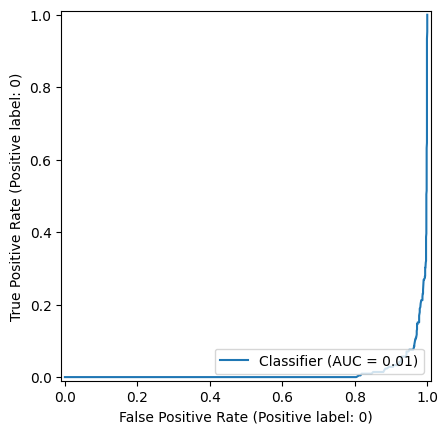

In [154]:
y_pred = rf.predict(X_test)
y_prob = rf.predict_proba(X_test)[:, 1]

threshold = 0.59
y_pred = (y_prob > threshold).astype(int)


print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(roc_auc_score(y_test, y_prob))
RocCurveDisplay.from_predictions(y_test, y_prob,pos_label=0)
plt.show()

In [155]:
# For TreeExplainer to work correctly with Random Forest
explainer = shap.TreeExplainer(rf,data=X_resampled)

# Use scaled version of test set
X_test_df = pd.DataFrame(X_test, columns=X_test.columns)

# SHAP values for class 0 (churn)
shap_values = explainer.shap_values(X_test_df,check_additivity=False)


100%|===================| 2825/2834 [03:32<00:00]       

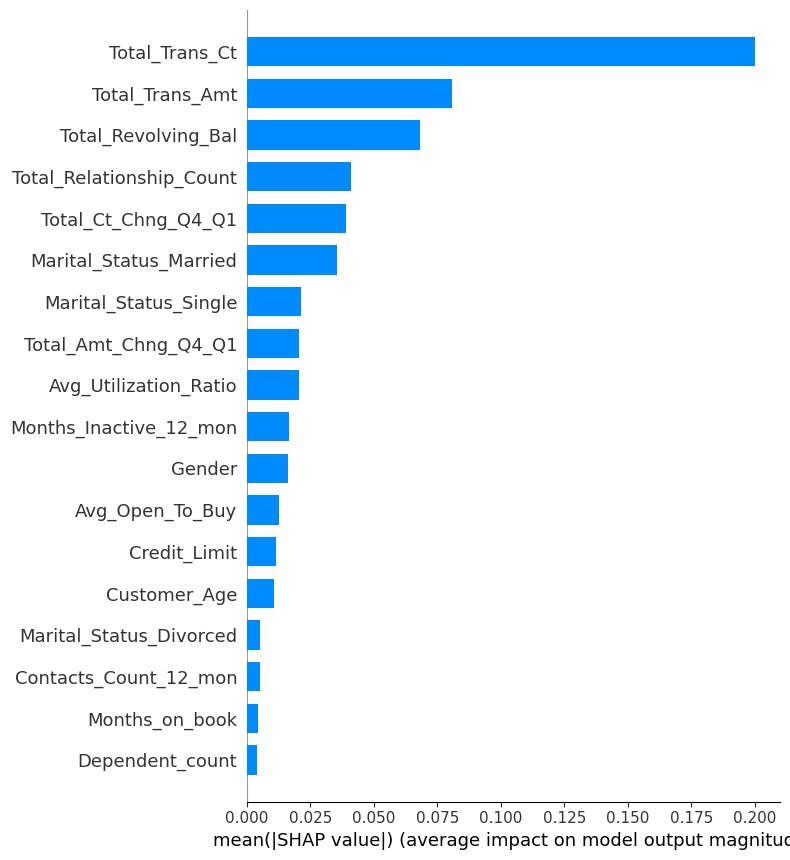

In [156]:
shap.summary_plot(shap_values[:,:,0], X_test_df, plot_type='bar')

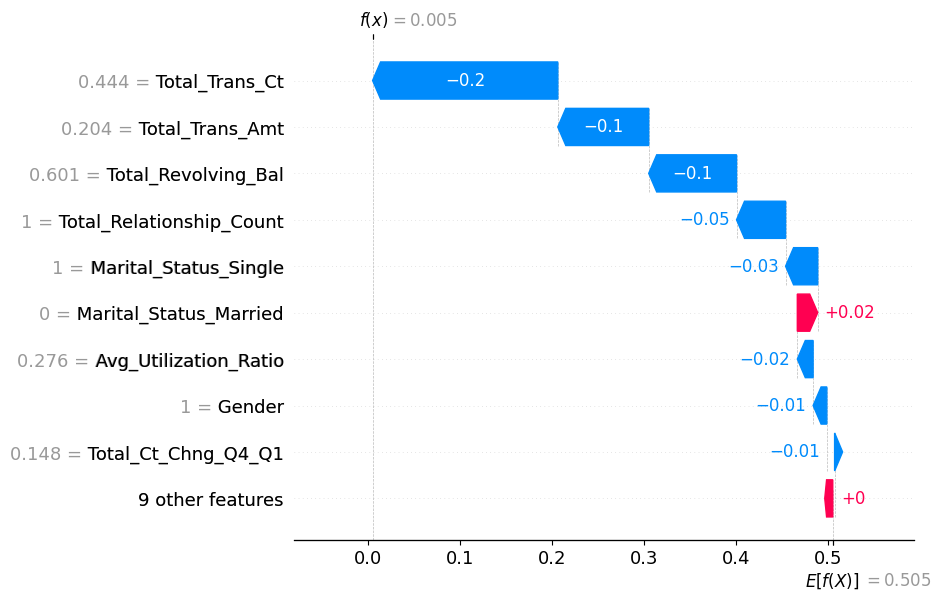

In [157]:
shap.plots.waterfall(shap.Explanation(values=shap_values[5,:,0],
                                      base_values=explainer.expected_value[0],
                                      data=X_test_df.iloc[5]))


# MODEL 8(LightGBM+SMOTE)

## Dataset preparation

In [18]:
df2 = pd.get_dummies(df1,columns=['Education_Level','Marital_Status','Income_Category','Card_Category'])
df2.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,Existing Customer,45,M,3,39,5,1,3,12691.0,777,...,False,False,False,True,False,False,True,False,False,False
1,Existing Customer,49,F,5,44,6,1,2,8256.0,864,...,True,False,False,False,False,True,True,False,False,False
2,Existing Customer,51,M,3,36,4,1,0,3418.0,0,...,False,False,False,False,True,False,True,False,False,False
4,Existing Customer,40,M,3,21,5,1,0,4716.0,0,...,False,False,False,True,False,False,True,False,False,False
5,Existing Customer,44,M,2,36,3,1,2,4010.0,1247,...,False,False,True,False,False,False,True,False,False,False


In [19]:
df2.replace({False:0,True:1},inplace=True)

C:\Users\amogh\AppData\Local\Temp\ipykernel_25540\3655403143.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({False:0,True:1},inplace=True)


In [20]:
df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)

C:\Users\amogh\AppData\Local\Temp\ipykernel_25540\479425355.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'Existing Customer':1,'Attrited Customer':0},inplace=True)


In [21]:
df2.replace({'M':1,'F':0},inplace=True)

C:\Users\amogh\AppData\Local\Temp\ipykernel_25540\1516440226.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.replace({'M':1,'F':0},inplace=True)


In [22]:
df2.dtypes

Attrition_Flag                      int64
Customer_Age                        int64
Gender                              int64
Dependent_count                     int64
Months_on_book                      int64
Total_Relationship_Count            int64
Months_Inactive_12_mon              int64
Contacts_Count_12_mon               int64
Credit_Limit                      float64
Total_Revolving_Bal                 int64
Avg_Open_To_Buy                   float64
Total_Amt_Chng_Q4_Q1              float64
Total_Trans_Amt                     int64
Total_Trans_Ct                      int64
Total_Ct_Chng_Q4_Q1               float64
Avg_Utilization_Ratio             float64
Education_Level_College             int64
Education_Level_Doctorate           int64
Education_Level_Graduate            int64
Education_Level_High School         int64
Education_Level_Post-Graduate       int64
Education_Level_Uneducated          int64
Marital_Status_Divorced             int64
Marital_Status_Married            

In [23]:
df2.Attrition_Flag.value_counts()

Attrition_Flag
1    5968
0    1113
Name: count, dtype: int64

## Optional Dataset manipulation

In [37]:
df2.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'],
      dtype='object')

In [38]:
cols_to_scale = ['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
drop = [
    # 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
    #    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
        'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
      #  'Marital_Status_Divorced', 'Marital_Status_Married',
      #  'Marital_Status_Single',
    'Income_Category_$120K +',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K','Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
      #  'Avg_Utilization_Ratio',
    'Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum',
       'Card_Category_Silver'
       ]
df3 = df2.drop(columns=drop)

In [39]:
# df3 = pd.DataFrame(df3, columns=[col for col in df2.columns ])#if col not in drop


In [40]:
X =df3.drop(columns=['Attrition_Flag'])
y = df3['Attrition_Flag']

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [42]:
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print("Shape of X_train after SMOTE:", X_resampled.shape)
print("Shape of y_train after SMOTE:", y_resampled.shape)

Shape of X_train after SMOTE: (9526, 18)
Shape of y_train after SMOTE: (9526,)


In [43]:
scaler = MinMaxScaler()
X_resampled[cols_to_scale] = scaler.fit_transform(X_resampled[cols_to_scale])
X_test[cols_to_scale] = scaler.transform(X_test[cols_to_scale])

In [44]:
y_resampled.value_counts()

Attrition_Flag
1    4763
0    4763
Name: count, dtype: int64

## Model Train

In [45]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier(
    n_estimators=200,
    learning_rate=0.05,
    class_weight="balanced",  # helps handle imbalance
    random_state=42
)

lgbm.fit(X_resampled, y_resampled)


[LightGBM] [Info] Number of positive: 4763, number of negative: 4763
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2027
[LightGBM] [Info] Number of data points in the train set: 9526, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier(class_weight='balanced', learning_rate=0.05, n_estimators=200,
               random_state=42)

In [46]:
from sklearn.metrics import classification_report

y_pred = lgbm.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.90      0.90      0.90       212
           1       0.98      0.98      0.98      1205

    accuracy                           0.97      1417
   macro avg       0.94      0.94      0.94      1417
weighted avg       0.97      0.97      0.97      1417

